In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
%cd /content/drive/MyDrive/Github/MusiCAN

/content/drive/MyDrive/Github/MusiCAN


In [3]:
!git pull

Already up to date.


# musiGAN

**Description:** 1-Track MuseGAN architecture build on MiniGAN.\
**Purpose:** implement a composing GAN.\
**Results:**

In [ ]:
! pip install muspy

In [42]:
!sudo apt install -y fluidsynth

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  fluid-soundfont-gm libfluidsynth1 libqt5x11extras5 qsynth
Suggested packages:
  fluid-soundfont-gs timidity jackd
The following NEW packages will be installed:
  fluid-soundfont-gm fluidsynth libfluidsynth1 libqt5x11extras5 qsynth
0 upgraded, 5 newly installed, 0 to remove and 20 not upgraded.
Need to get 120 MB of archives.
After this operation, 150 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fluid-soundfont-gm all 3.1-5.1 [119 MB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libfluidsynth1 amd64 1.1.9-1 [137 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fluidsynth amd64 1.1.9-1 [20.7 kB]
Get:4 http://archi

In [45]:
!pip install --upgrade pyfluidsynth

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [48]:
import numpy as np
import matplotlib.pyplot as plt
import torch 

import random
import datetime
from tqdm import tqdm

import pickle
import json
import os

from IPython.display import Audio, display
import muspy
import pypianoroll
from pypianoroll import Multitrack, Track
import fluidsynth

In [37]:
# run this cell if you didn't do it already 
muspy.download_musescore_soundfont() 

Start downloading MuseScore General soundfont.
MuseScore General soundfont has successfully been downloaded to : /root/.muspy/musescore-general.


In [38]:
# run this cell if you didn't do it already 
muspy.download_bravura_font() 

Start downloading Bravura font.
Bravura font has successfully been downloaded to : /root/.muspy/musescore-general.


## Model

### Support classes

In [2]:
# code from https://www.hassanaskary.com/python/pytorch/deep%20learning/2020/09/19/intuitive-explanation-of-straight-through-estimators.html#:~:text=A%20straight%2Dthrough%20estimator%20is,function%20was%20an%20identity%20function.

class STEFunction(torch.autograd.Function):
    @staticmethod
    def forward(ctx, input):
        return (input > 0).float()

    @staticmethod
    def backward(ctx, grad_output):
        return torch.nn.functional.hardtanh(grad_output)

class StraightThroughEstimator(torch.nn.Module):
    def __init__(self):
        super(StraightThroughEstimator, self).__init__()

    def forward(self, x):
        x = STEFunction.apply(x)
        return x

### musiGAN

#### Generator

In [3]:
class GeneratorBlock(torch.nn.Module):
    """ 2d transconv layer, batch normalization & ReLU """

    def __init__(self, in_dim, out_dim, kernel, stride):
        super().__init__()

        self.gen_block = torch.nn.Sequential(
            torch.nn.ConvTranspose2d(in_dim, out_dim, kernel, stride),
            torch.nn.BatchNorm2d(out_dim),
            torch.nn.ReLU()
            )

    def forward(self, x):
        return self.gen_block(x)

In [7]:
class Generator (torch.nn.Module) :
    """
    1-track museGAN generator, consisting of two sub-networks (so-called 
    temporal and bar generator)

    input : seed vector, a normally distributed random vector, 
            length: (B + 1) * 64 = 5 * 64 here
    output: pianaroll, binary tensor, shape: (B x T x P) = (4 x 96 x 84) here
    """

    def __init__ (self, log = False, **kwargs) : 
        super().__init__(**kwargs)
        
        self.temporal_generator = torch.nn.Sequential(
            
            # heuristically added linear layer
            torch.nn.Linear(1, 31),
            torch.nn.BatchNorm1d(64),
            torch.nn.ReLU(),

            # transconv layer 1
            torch.nn.ConvTranspose1d(64, 1024, 2, 2),
            torch.nn.BatchNorm1d(1024),
            torch.nn.ReLU(),

            # transconv layer 2
            torch.nn.ConvTranspose1d(1024, 1, 3, 1),
            torch.nn.BatchNorm1d(1),
            torch.nn.ReLU()
        )

        self.bar_generator = torch.nn.Sequential(
            
            # transconv layers
            GeneratorBlock( 128, 1024, (2, 1), (2, 1)),
            GeneratorBlock(1024,  512, (2, 1), (2, 1)),
            GeneratorBlock( 512,  256, (2, 1), (2, 1)),
            GeneratorBlock( 256,  256, (2, 1), (2, 1)),
            GeneratorBlock( 256,  128, (3, 1), (3, 1)),
            GeneratorBlock( 128,   64, (1, 7), (1, 7)),

            # last layer with tanh & binarization activation fct.s
            torch.nn.ConvTranspose2d(64, 1, (1, 12), (1, 12)),
            torch.nn.BatchNorm2d(1),
            torch.nn.Tanh(),
            StraightThroughEstimator() # binarization
        )

        if log :
            print(f"Generator: parameters: {self.count_params()}")
            print("")

    def count_params (self) :
        """count number of trainable parameters"""
        return sum(p.numel() for p in self.parameters() if p.requires_grad)


    def forward (self, seed) :
        seeds = torch.chunk(seed, chunks = 5, dim = 1)
        
        # create time-independent first half of seed for bar generator
        bar_seed_1 = seeds[0]
        bar_seed_1 = bar_seed_1.view((-1, 64, 1, 1)) # reshape for transconv layers

        # generate pianorolls bar by bar
        generated_bars = []
        for temporal_seed in seeds[1:]:
            
            ## generate time-dependent second half of seed for bar generator
            
            temporal_seed = temporal_seed.view(-1, 64, 1) # reshape for transconv layers
            # print(f"temporal seed: {temporal_seed.size()}")
            bar_seed_2 = self.temporal_generator(temporal_seed) # (batch size x 1 x 64)
            # print(f"bar seed 2: {bar_seed_2.size()}")

            ## reshape & concatenate both halfs of seed for bar generator 
            
            bar_seed_2 = bar_seed_2.view(-1, 64, 1, 1)
            bar_seed = torch.cat((bar_seed_1, bar_seed_2), dim = 1) # (batch size x 128 x 1 x 1)
            # print(f"bar seed: {bar_seed.size()}")

            ## generate one bar 
            
            generated_bar = self.bar_generator(bar_seed) # (batch size x 1 x 48 x 84)
            # print(f"bar seed: {generated_bar.size()}")
            generated_bars.append(generated_bar) 

        pianoroll = torch.cat(generated_bars, dim = 1) # (batch size x 4 x 48 x 84) 
        # print(f"output: {pianoroll.size()}")

        return pianoroll

#### Discriminator

In [8]:
class DiscriminatorBlock(torch.nn.Module):
    """3d conv layer & Leaky ReLU"""

    def __init__(self, in_dim, out_dim, kernel, stride):
        super().__init__()
        self.dis_block = torch.nn.Sequential(
            torch.nn.Conv3d(in_dim, out_dim, kernel, stride),
            torch.nn.LeakyReLU(negative_slope = 0.2) # MuseGAN Hyperparameter
            )

    def forward(self, x):
        return self.dis_block(x)

In [9]:
class Discriminator (torch.nn.Module) :
    """
    1-Track museGAN discriminator
    
    input : (B x T x P) binary pianoroll
    output: single number, prob. that the input pianoroll is a 
            real and not generated
    """


    def __init__ (self, log = False, **kwargs) :
        super().__init__(**kwargs)

        # conv layers
        self.discriminator_conv = torch.nn.Sequential(
            DiscriminatorBlock(  1, 128, (2, 1,  1), (1, 1,  1)),
            DiscriminatorBlock(128, 128, (3, 1,  1), (1, 1,  1)),
            DiscriminatorBlock(128, 128, (1, 1, 12), (1, 1, 12)), 
            DiscriminatorBlock(128, 128, (1, 1,  7), (1, 1,  7)),
            DiscriminatorBlock(128, 128, (1, 2,  1), (1, 2,  1)),
            DiscriminatorBlock(128, 128, (1, 2,  1), (1, 2,  1)), 
            DiscriminatorBlock(128, 256, (1, 4,  1), (1, 2,  1)),
            DiscriminatorBlock(256, 512, (1, 3,  1), (1, 2,  1)))
        
        # fully-connected layers
        self.discriminator_fc = torch.nn.Sequential(
            torch.nn.Linear(1024, 1024),
            torch.nn.LeakyReLU(negative_slope = 0.2),
            torch.nn.Linear(1024, 1))
        
        if log :
            print(f"Discriminator parameters: {self.count_params()}")
            print("")

    def count_params (self) :
        """count number of trainable parameters"""
        return sum(p.numel() for p in self.parameters() if p.requires_grad)

    def forward (self, pianoroll):
        pianoroll = pianoroll.view(-1, 1, 4, 48, 84) # reshape for transconvs
        conv_output = self.discriminator_conv(pianoroll)
        # print(conv_output.size())
        fc_input = conv_output.view(-1, 1024)
        judgement = self.discriminator_fc(fc_input)
        return judgement

#### Architecture Tests

Generator: parameters: 2004484



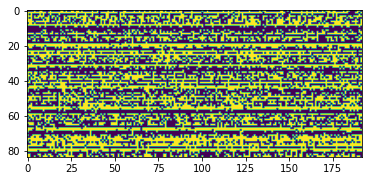

In [10]:
# test generator

gen = Generator(log=True)
gen_out = gen.forward(torch.rand(10, 5*64))
pr = gen_out.cpu().detach().numpy()
pr = pr.reshape((10, 48 * 4, 84))

plt.imshow(pr[0].T)

In [11]:
# test discriminator

dis = Discriminator(log=True)

dis_out = dis.forward(gen_out)
judge = torch.sigmoid(dis_out).cpu().detach().numpy().flatten()

print(f"Prob. that image is real: {judge[0]*100:.0f}%")

Discriminator parameters: 2002689

Prob. that image is real: 50%


## Training classes

In [12]:
def quick_test(GEN, DIS, data): 
    
    # Test on generated data
    
    ## Generator
    test_seeds = torch.normal(0, 1, (5, seed_length))
    examples = GEN.forward(test_seeds)
    gen_img = examples[0].reshape(number_pitches, number_blips)
    gen_img = gen_img.detach().numpy()

    ## Discriminator
    gen_judgements = DIS.forward(examples)
    gen_judgement = torch.sigmoid(gen_judgements[0][0]).detach().numpy()

    # Results
    plt.title("Generator output x")
    plt.imshow(gen_img);
    print(f"Discriminator p(x_gen = real): {gen_judgement*100:.0f}%")

    # Test on real data
    real_judgement = torch.sigmoid(DIS.forward(data))[0][0].detach().numpy()
    print(f"Discriminator p(x_real = real) = {real_judgement*100:.0f}%")

In [13]:
def generator_goodness(generated_batch, real_batch):
    """ compare two batches of data by calculating the absolute mean difference"""
    
    # averaged over batches 
    generated_mean = torch.mean(generated_batch)
    real_mean = torch.mean(real_batch)

    # take difference & absolut value, average over features lastly
    goodness_criteria = torch.mean(torch.abs(real_mean - generated_mean))

    return(goodness_criteria.detach().cpu().numpy())

### Training Class

In [19]:
class Training :
    def __init__ (self, real_pianorolls, batch_size) :
        self.device = 'cuda'  if torch.cuda.is_available() else  'cpu'

        # Storing external parameters
        self.batch_size  = batch_size
        self.seed_length = 64 * 5
        
        # Preparing training data
        self.training_set = real_pianorolls
        self.data_loader  = torch.utils.data.DataLoader(self.training_set,
                                batch_size = self.batch_size, 
                                drop_last = True,
                                shuffle = True)

        # Initializing GAN
        self.gen = Generator().to(self.device)
        self.dis = Discriminator().to(self.device)
        self.optimizer_gen = torch.optim.Adam(self.gen.parameters(), 
                                              lr = 0.001,
                                              betas = (0.5, 0.9)) 
            # ADAM parameters from GAN tutorial
        self.optimizer_dis = torch.optim.Adam(self.dis.parameters(), 
                                              lr = 0.001,
                                              betas = (0.5, 0.9))



    def train (self, epochs, k = 1, loss_func = "WGAN") :
        # Training parameters
        self.k = k
        self.loss_function = loss_func

        assert  type(epochs) == int
        assert  epochs >= 1
        assert  type(k) == int
        assert  k >= 1
        assert  self.loss_function in ["GAN", "WGAN"]
        
        # Logging
        self.losses       = np.zeros((5, epochs))
        self.probs        = np.zeros((2, epochs))
        self.gen_goodness = np.zeros(epochs)
        

        # Main training loop
        for epoch in range(epochs) :
            loss         = []
            probs        = []
            gen_goodness = []

            for train_batch in tqdm(self.data_loader) :
                batch_losses, batch_probs, batch_gen_goodness = \
                    self.training_step(train_batch[0].to(self.device))
                loss.append(batch_losses)
                probs.append(batch_probs)
                gen_goodness.append(batch_gen_goodness)
            
            # Loging
            self.losses[:, epoch]    = np.array(loss).mean(axis=0)
            self.probs[:, epoch]     = np.array(probs).mean(axis=0)
            self.gen_goodness[epoch] = np.array(gen_goodness).mean(axis=0)

            print(" epoch", epoch, "complete.")

        # Returning trained GAN
        return self.gen, self.dis

  

    def training_step (self, batch_real) :
        dis_losses = torch.zeros(size = (self.k,)) # .to(self.device)  # logging
        for i in range(self.k):
            # Forward propagation
            seed_vector = torch.normal(0, 1, size = 
                                       (self.batch_size, self.seed_length)) \
                            .to(self.device)
            batch_gen = self.gen.forward(seed_vector)
            
            judgement_real = self.dis.forward(batch_real)
            judgement_gen  = self.dis.forward(batch_gen)

            # Calculating the Discriminator loss function
            if self.loss_function == "GAN" :
                prob_real = torch.sigmoid(judgement_real)
                prob_gen  = torch.sigmoid(judgement_gen)
                loss_term_real = - torch.mean(torch.log(prob_real))
                loss_term_gen  = - torch.mean(torch.log(1 - prob_gen))
                reg_term       = torch.tensor(0.)
            elif self.loss_function == "WGAN" :
                loss_term_real = - torch.mean(judgement_real)
                loss_term_gen  = torch.mean(judgement_gen)
                var_g    = torch.var(judgement_gen)
                var_r    = torch.var(judgement_real)
                reg_term = torch.where(var_g > 1, (var_g - 1)**2, torch.zeros_like(var_g)) \
                           + torch.where(var_r > 1, (var_r - 1)**2, torch.zeros_like(var_r))
            else :
                print(f"Warning: '{self.loss_function}' loss function isn't\
                        an option!")

            loss_dis = loss_term_real + loss_term_gen + reg_term
            
            # Discriminator update
            self.optimizer_dis.zero_grad()
            loss_dis.backward()
            self.optimizer_dis.step()
            
            dis_losses[i] = loss_dis   # logging

        loss_dis = torch.mean(dis_losses)  # logging


        # Calculating the Generator loss function
        judgement_new = self.dis.forward(batch_gen)
        
        if self.loss_function == "GAN" :
            prob_new = torch.sigmoid(judgement_new)
            loss_gen = -torch.mean(torch.log(prob_new)) 
        elif self.loss_function == "WGAN" :
            loss_gen = -torch.mean(judgement_new)
        
        # Generator update
        self.optimizer_gen.zero_grad()
        loss_gen.backward()
        self.optimizer_gen.step()

        # Output Losses
        losses_out = [loss_dis.detach().cpu().numpy(), 
                      loss_term_real.detach().cpu().numpy(), 
                      loss_term_gen.detach().cpu().numpy(), 
                      reg_term.detach().cpu().numpy(), 
                      loss_gen.detach().cpu().numpy()]

        # Output averaged judgement probabilities 
        D_real = torch.mean(torch.sigmoid(judgement_real))
        D_gen  = torch.mean(torch.sigmoid(judgement_gen))
        probs_out = [D_real.detach().cpu().numpy(), D_gen.detach().cpu().numpy()]

        # Output generator goodness (already averaged over batch)
        gen_goodness = generator_goodness(batch_gen, batch_real)

        # Quick Test for debugging 
        # quick_test(self.gen, self.dis) 

        return losses_out, probs_out, gen_goodness



    def save (self, name) :
        file_name = training_filepath + name + ".obj"
        file      = open(file_name, "wb")
        pickle.dump(self, file)
        print(f"Saved training under '{file_name}'")
        os.makedirs(training_filepath + "/generated_audio_examples")

    def load (name) :
        file_name = training_filepath + name + ".obj"
        file      = open(file_name, "rb")
        return pickle.load(file)

## Training the model

In [15]:
%cd /content/drive/MyDrive/MusiCAN_data

/content/drive/MyDrive/MusiCAN_data


In [16]:
# helper function to load json dict

def load_json(filepath):
  with open(filepath, "r") as read_file:
    json_dict = json.load(read_file)
  return(json_dict)

In [17]:
# load data

file_directory = "./lpd5_full_4bars"
loaded_data_pars = load_json(file_directory + "/preparation_params.json")
loaded_data = np.load(file_directory + "/prepared_arrays.npz")
loaded_data_array, _ = loaded_data["data"], loaded_data["labels"]

# convert to pytorch tensor
data_tensor = torch.as_tensor(loaded_data_array, dtype=torch.float32) 

# reshape for model input 
n_instances, n_timesteps, n_pitches = data_tensor.size() # (shape: n_instances x n_timesteps x n_pitches)
data_tensor = data_tensor.view(n_instances, 4, int(n_timesteps / 4), n_pitches) 
data_tensor = data_tensor.view(n_instances, 1, 4, int(n_timesteps / 4), n_pitches) 

# create pytorch dataset & dataloader
lpd5_dataset = torch.utils.data.TensorDataset(data_tensor)

In [20]:
GANTrainer  = Training(lpd5_dataset, batch_size = 33)
trained_GAN = GANTrainer.train(epochs = 1, k = 5, loss_func="WGAN")

########################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################################

In [21]:
# storage
model_name = "MusiGANold_test1"
training_filepath = "./lpd5_full_4bars/trained_models/" + model_name
os.makedirs(training_filepath)
os.makedirs(training_filepath + "/generated_audio_examples") # for evaluation later

GANTrainer.save(model_name)

OverflowError: ignored

## Evaluate Model

  0%|          | 0/10 [00:00<?, ?it/s]

-1574048972800%:


 10%|█         | 1/10 [00:07<01:07,  7.46s/it]

-1574036172800%:


 20%|██        | 2/10 [00:14<00:58,  7.32s/it]

-1574135808000%:


 30%|███       | 3/10 [00:21<00:51,  7.29s/it]

-1574054502400%:


 40%|████      | 4/10 [00:29<00:43,  7.23s/it]

-1574045900800%:


 50%|█████     | 5/10 [00:36<00:36,  7.23s/it]

-1574049177600%:


 60%|██████    | 6/10 [00:43<00:28,  7.22s/it]

-1574022553600%:


 70%|███████   | 7/10 [00:50<00:21,  7.21s/it]

-1573978521600%:


 80%|████████  | 8/10 [00:58<00:14,  7.32s/it]

-1574047129600%:


 90%|█████████ | 9/10 [01:05<00:07,  7.32s/it]

-1574036992000%:


100%|██████████| 10/10 [01:12<00:00,  7.29s/it]


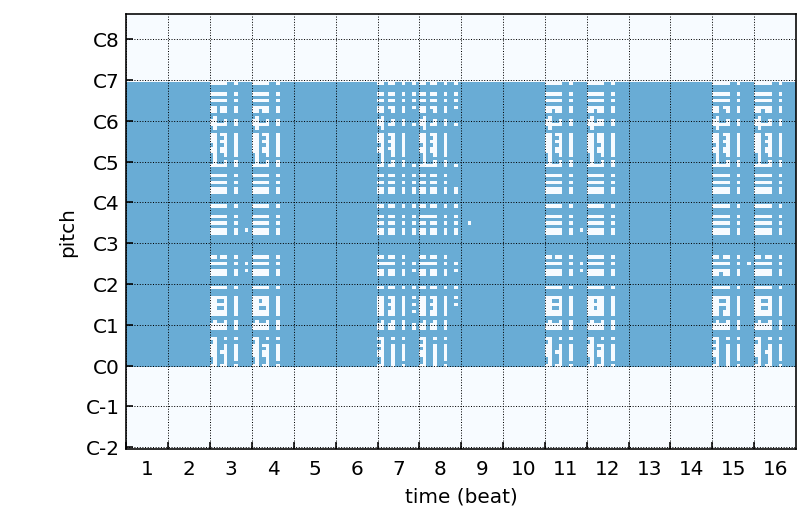

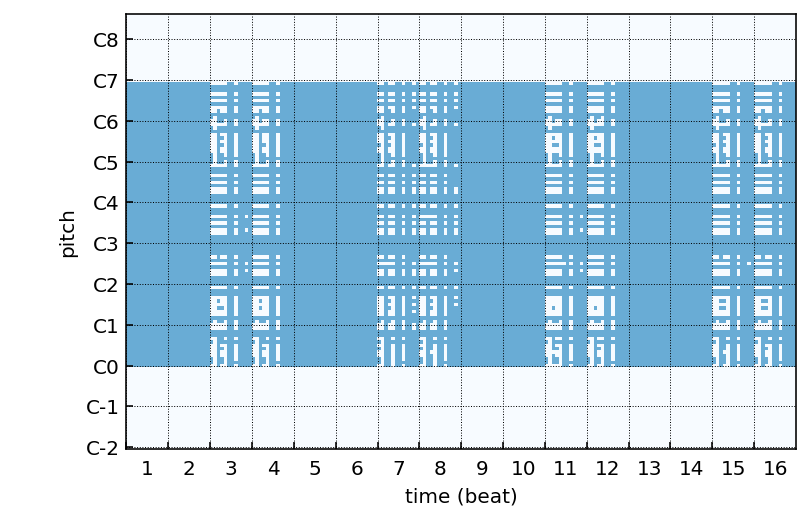

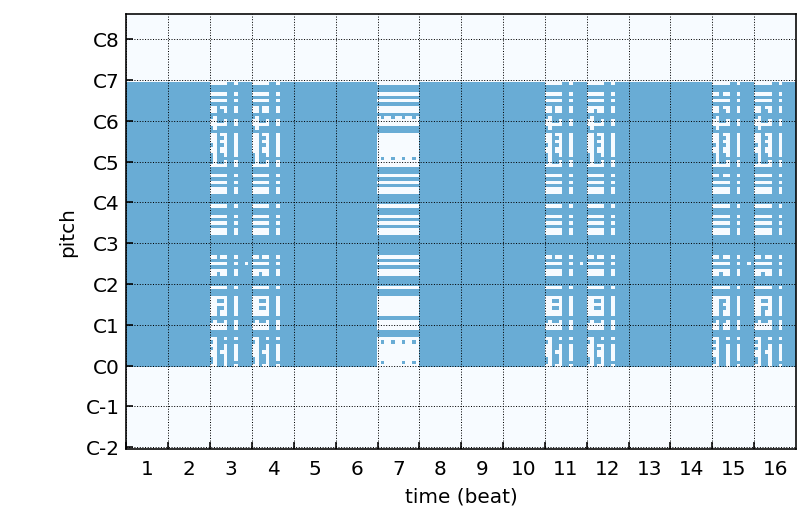

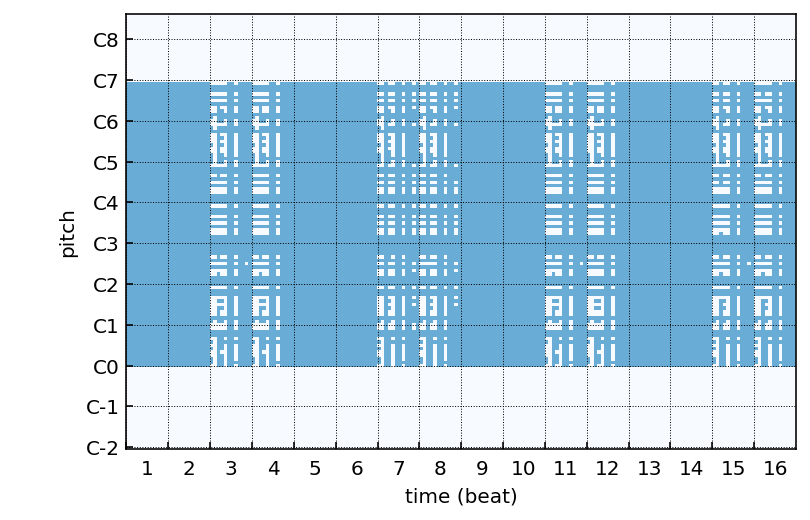

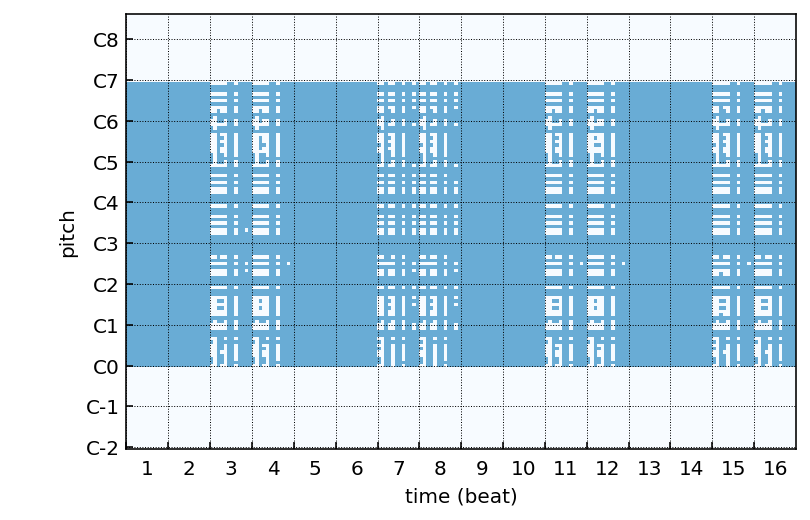

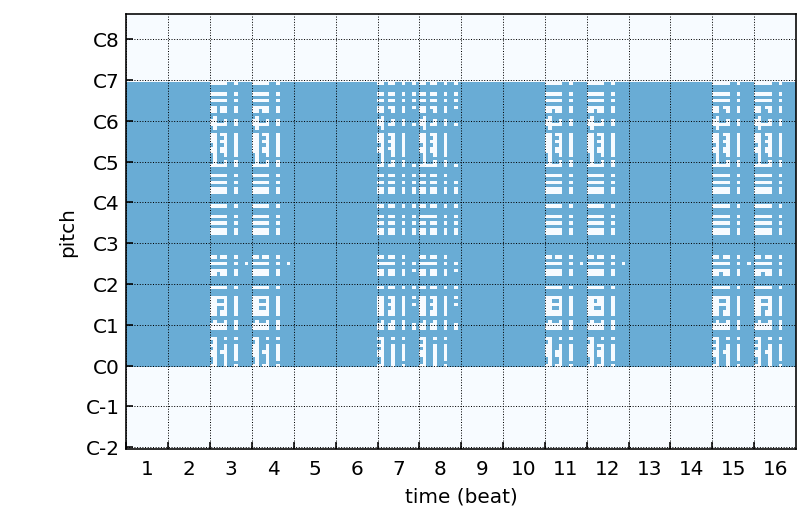

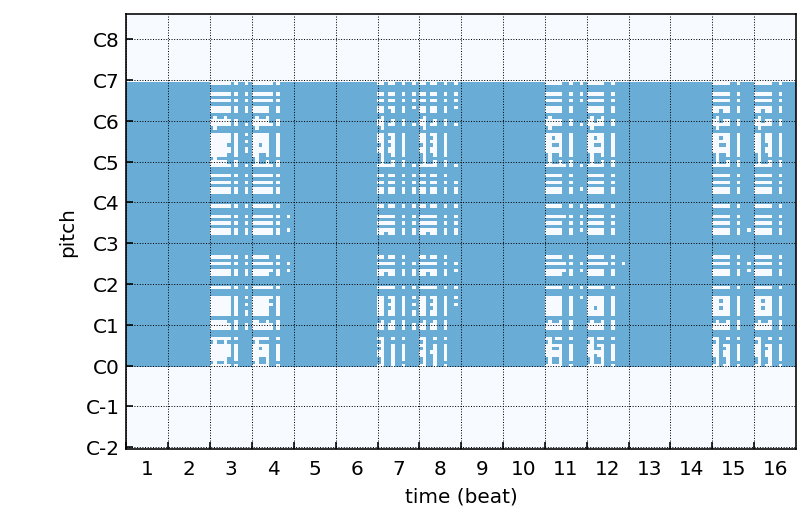

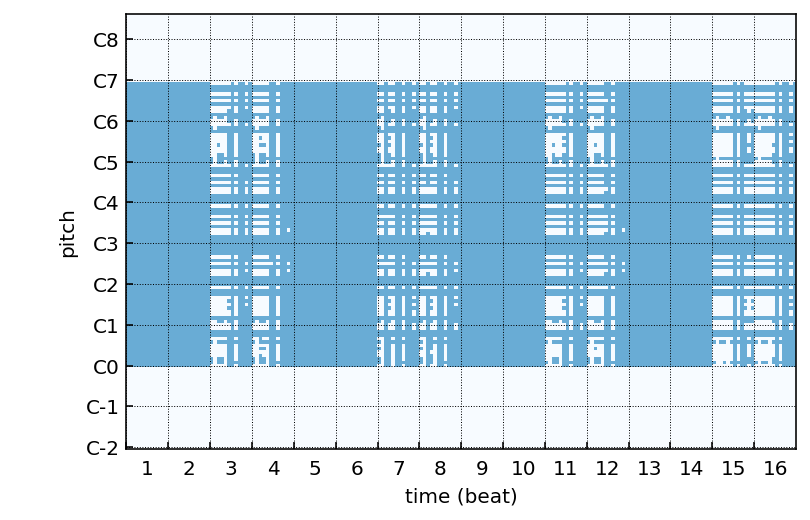

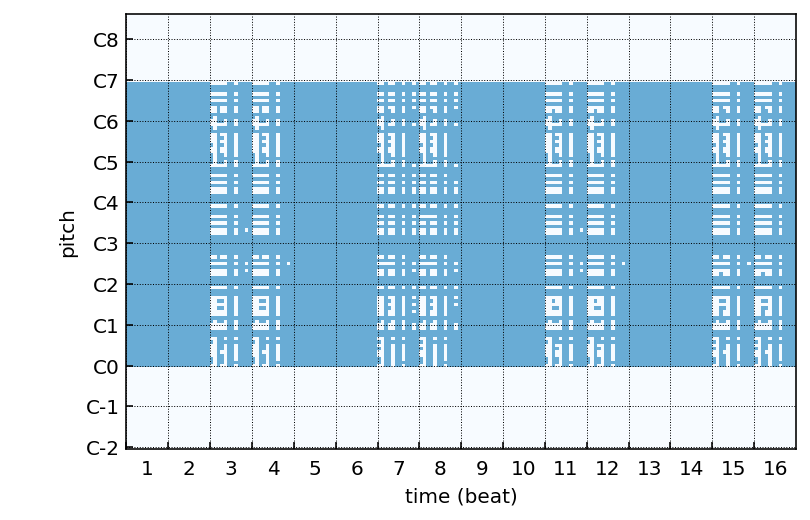

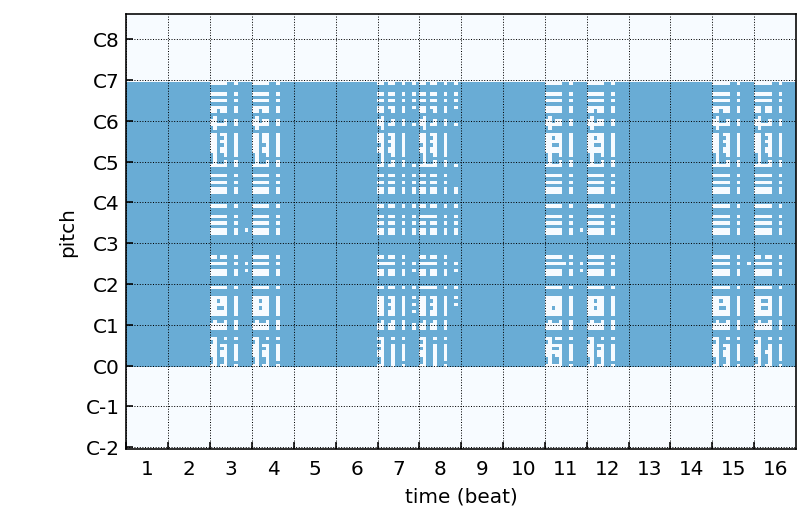

In [49]:
# load model
loaded_GANTrainer = GANTrainer # .load(model_name) 
loaded_gen, loaded_dis = loaded_GANTrainer.gen, loaded_GANTrainer.dis

# generate & judge some samples
n_generated = 10 # number of generated samples / batch size
device = 'cuda'  if torch.cuda.is_available() else  'cpu'
generated_pianorolls = loaded_gen.forward(torch.rand(n_generated, 5*64).to(device))
pianoroll_judgements = loaded_dis.forward(generated_pianorolls)

# show pianoroll, store & display converted wave (audio) file

## reshape
generated_pianorolls = generated_pianorolls.view(n_generated, n_timesteps, n_pitches).detach().cpu().numpy()
pianoroll_judgements = pianoroll_judgements.flatten().detach().cpu().numpy()

## trainings data params (improve: load with model))
lowest_pitch = 24
n_pitches = 84 
beat_resolution = 12
n_bars = 4 
n_timesteps = beat_resolution * 4 * n_bars

for i in tqdm(range(n_generated)):
    X, y = generated_pianorolls[i, :, :], pianoroll_judgements[i]
    
    judgement_of_X = f"{y*100:.0f}%"
    
    X_padded = np.pad(X, ((0, 0), (lowest_pitch, 128 - lowest_pitch - n_pitches))) # complete pitch range
    X_music = muspy.from_pianoroll_representation(X_padded > 0, 
                resolution = beat_resolution, encode_velocity = False) # convert to muspy.music_object

    X_timestamp = datetime.datetime.now()
    muspy.write_audio(path = training_filepath + f"/generated_audio_examples/{judgement_of_X}_{X_timestamp}.wav", 
                      music = X_music) 
    
    # display audio & show pianoroll
    print(judgement_of_X + ":")
    display(Audio(filename = training_filepath + f"/generated_audio_examples/{judgement_of_X}_{X_timestamp}.wav"))
    muspy.visualization.show_pianoroll(X_music)

## Junk & quick tests